#World Cup 2023 Analysis
#####**`Syed Yasir Ul Haq`** | `yasirulhaq630@gmail.com`



The main objective of this notebook is to perform EDA of the World Cup 2023 data, extracting meaningful insights and patterns to gain a deeper understanding of the tournament's dynamics. The EDA process involves statistical and visual exploration of various aspects of the dataset, such as team performances, player statistics, and match outcomes.

Key components of the exploratory data analysis include:

1.   Team Performance Analysis
2.   Player Statistics Exploration
1.   Match Outcome Trends
2.   Temporal Analysis


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Worldcup/CWC23_all_innings.csv')
df.head()

,team,player,bat_or_bowl,bb_bf,runs,wkts,wicketball_prob,runs_per_ball,opposition,ground,start_date,overs,mdns,econ,inns,4s,6s,sr,not_out,mins
0,PAK,Shaheen Shah Afridi (PAK),bowl,60,45,3.0,0.05,0.750000,v South Africa,Chennai,27-Oct-23,10.0,0.0,4.5,2,NaN,NaN,NaN,NaN,NaN
1,ENG,DJ Willey (ENG),bowl,60,45,3.0,0.05,0.750000,v India,Lucknow,29-Oct-23,10.0,2.0,4.5,1,NaN,NaN,NaN,NaN,NaN
2,NZ,MJ Henry (NZ),bowl,60,48,3.0,0.05,0.800000,v England,Ahmedabad,5-Oct-23,10.0,1.0,4.8,1,NaN,NaN,NaN,NaN,NaN
3,NZ,LH Ferguson (NZ),bowl,60,49,3.0,0.05,0.816667,v Bangladesh,Chennai,13-Oct-23,10.0,0.0,4.9,1,NaN,NaN,NaN,NaN,NaN
4,AFG,Noor Ahmad (AFG),bowl,60,49,3.0,0.05,0.816667,v Pakistan,Chennai,23-Oct-23,10.0,0.0,4.9,1,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Creating a comprehensive profile report of the DataFrame 'df' to gain insights
# into its structure, quality, and potential issues.

from ydata_profiling import ProfileReport
profile = ProfileReport(df, title="Profiling Report")

In [ ]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Replacing the NAN values with 0 in the Dataframe 'df'
df.fillna(0,inplace=True)

# Team Analysis
Tasks to perform:
 - Explore team-wise performance metrics.
 - Analyze runs scored, wickets taken, and batting/bowling styles.
 - Identify top-performing teams and their strengths.

In [ ]:
# Name of the teams participated in the tournament

unique_values = df['team'].unique()
unique_values

array(['PAK', 'ENG', 'NZ', 'AFG', 'NED', 'BAN', 'SA', 'SL', 'AUS', 'IND'],
      dtype=object)

### Team Bowling Performance

In [ ]:
bowling = df[df['bat_or_bowl']=='bowl'].groupby('team').agg({
    'bb_bf':'sum',
    'runs':'sum',
    'wkts':'sum',
    'overs':'sum',
    'mdns':'sum',
    'econ':'mean',
})

# Calculate bowling average and round to 2 digits
bowling['bowling_avg'] = (bowling['runs'] / bowling['wkts']).round(2)

# Round the 'econ' column to 2 digits
bowling['econ'] = bowling['econ'].round(2)

bowling.reset_index(inplace=True)

print(bowling)

  team  bb_bf  runs  wkts  overs  mdns  econ  bowling_avg
0  AFG   2403  2144  53.0  399.1  13.0  5.76        40.45
1  AUS   2695  2512  77.0  448.3  13.0  5.66        32.62
2  BAN   2390  2414  51.0  397.0  13.0  6.10        47.33
3  ENG   2343  2261  65.0  388.7  14.0  6.07        34.78
4  IND   2506  1973  94.0  415.4  23.0  4.96        20.99
5  NED   2502  2540  63.0  416.2  11.0  6.17        40.32
6   NZ   2704  2664  71.0  449.2  17.0  6.24        37.52
7  PAK   2478  2566  65.0  412.6   8.0  6.29        39.48
8   SA   2561  2324  88.0  424.5  20.0  5.68        26.41
9   SL   2259  2424  50.0  375.5  12.0  6.61        48.48


In [ ]:
sortwkts = bowling.sort_values(['wkts'], ascending = False)
sortovers = bowling.sort_values(['overs'], ascending = False)
sortmdns = bowling.sort_values(['mdns'], ascending = False)
sortecon = bowling.sort_values(['mdns'], ascending = True)

print(sortwkts[['team', 'overs', 'wkts', 'mdns', 'econ','bowling_avg']])

  team  overs  wkts  mdns  econ  bowling_avg
4  IND  415.4  94.0  23.0  4.96        20.99
8   SA  424.5  88.0  20.0  5.68        26.41
1  AUS  448.3  77.0  13.0  5.66        32.62
6   NZ  449.2  71.0  17.0  6.24        37.52
3  ENG  388.7  65.0  14.0  6.07        34.78
7  PAK  412.6  65.0   8.0  6.29        39.48
5  NED  416.2  63.0  11.0  6.17        40.32
0  AFG  399.1  53.0  13.0  5.76        40.45
2  BAN  397.0  51.0  13.0  6.10        47.33
9   SL  375.5  50.0  12.0  6.61        48.48


  team  overs  wkts  mdns  econ  bowling_avg
4  IND  415.4  94.0  23.0  4.96        20.99
8   SA  424.5  88.0  20.0  5.68        26.41
1  AUS  448.3  77.0  13.0  5.66        32.62
6   NZ  449.2  71.0  17.0  6.24        37.52
3  ENG  388.7  65.0  14.0  6.07        34.78
7  PAK  412.6  65.0   8.0  6.29        39.48
5  NED  416.2  63.0  11.0  6.17        40.32
0  AFG  399.1  53.0  13.0  5.76        40.45
2  BAN  397.0  51.0  13.0  6.10        47.33
9   SL  375.5  50.0  12.0  6.61        48.48


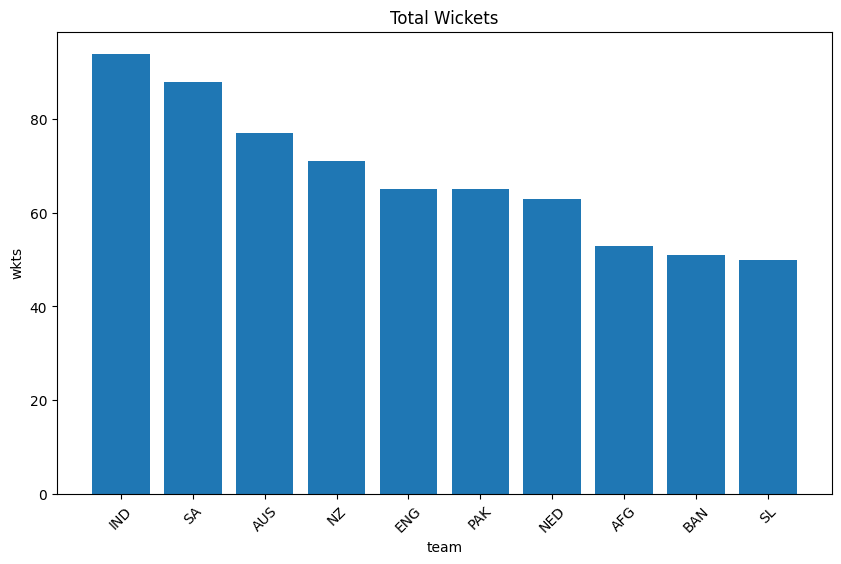

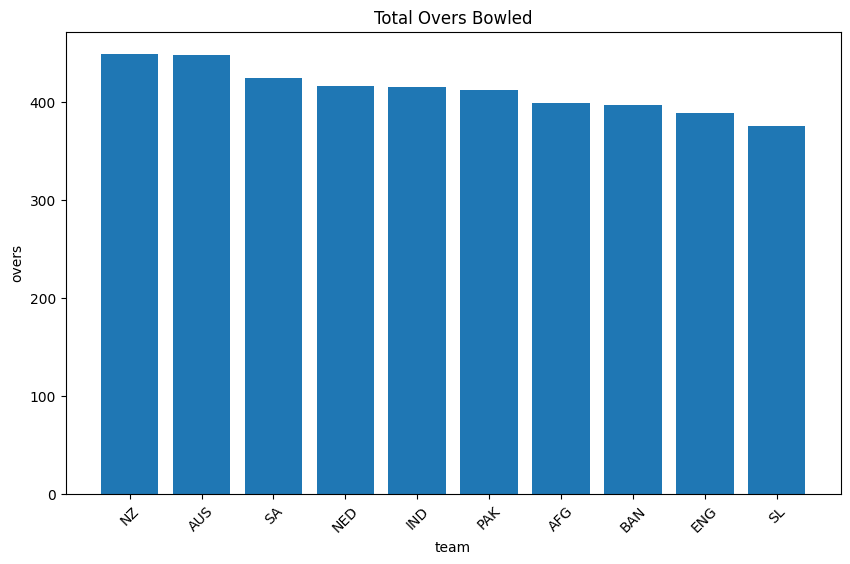

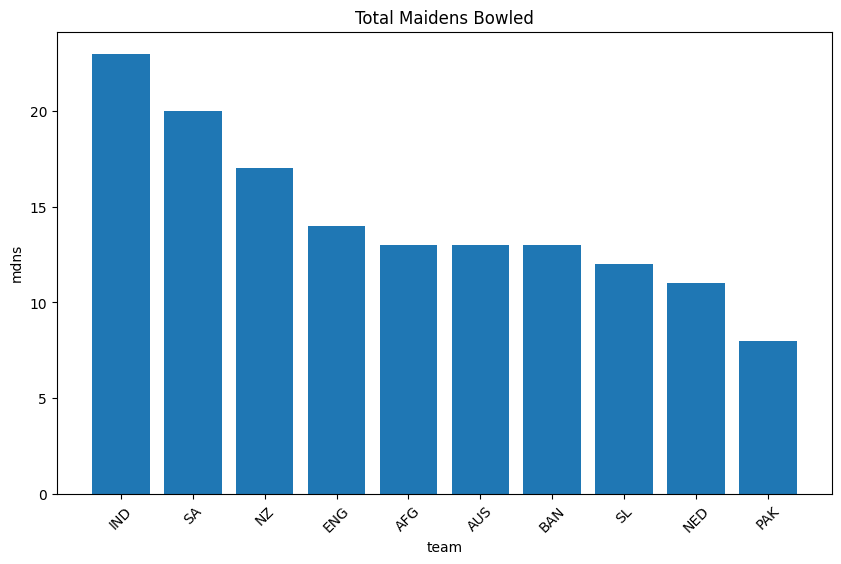

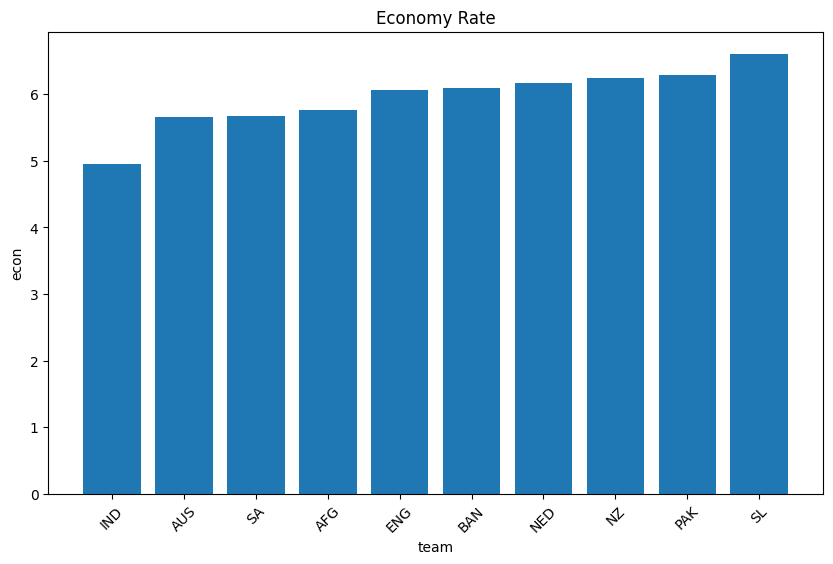

In [ ]:
# Function to plot bar graph
def plot_bar(df, x_label, y_label, title):
    plt.figure(figsize=(10, 6))
    plt.bar(df[x_label], df[y_label])
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(title)
    plt.xticks(rotation=45)
    plt.show()

# Plotting for each metric
plot_bar(sortwkts, 'team', 'wkts', 'Total Wickets')
plot_bar(sortovers, 'team', 'overs', 'Total Overs Bowled')
plot_bar(sortmdns, 'team', 'mdns', 'Total Maidens Bowled')
plot_bar(sortecon, 'team', 'econ', 'Economy Rate')

# **Bowling Analysis**

### **Wickets**

According to the data, India got 94 wickets, South Africa got 88 wickets, and Australia got 77 wickets emerge as the top three teams, securing the highest number of wickets in the tournament. In contrast, Sri Lanka has the lowest wicket count, with 50 wickets.

### **Overs Bowled**

New Zealand and Australia stand out for delivering the most overs, 499 and 448 respectively. On the other hand, Sri Lanka holds the record for bowling the fewest overs, totaling 375.

### **Economy and Maidens**

India showcases the most economical bowling performance among all teams with an economy rate of 4.9, closely followed by Australia. Conversely, Sri Lanka and Pakistan experience challenges with their economy rates, ranking among the least favorable. The Indian bowling unit also leads in delivering the highest number of maidens throughout the tournament.

In conclusion, the comprehensive bowling analysis underscores the dominance of the Indian Team, showcasing the best bowling unit in the World Cup.

### Team Batting Performance

In [ ]:
batting = df[df['bat_or_bowl']=='bat'].groupby('team').agg({
    'bb_bf':'sum',
    'runs':'sum',
    'sr':'mean',
    '4s':'sum',
    '6s':'sum',
    'not_out':'mean',
    'mins':'sum'
})

batting['sr'] = (batting['sr']).round()
batting.reset_index(inplace=True)

# Sorting dataframes
sortruns = batting.sort_values(['runs'], ascending=False)
sort4s = batting.sort_values(['4s'], ascending=False)
sort6s = batting.sort_values(['6s'], ascending=False)
sortsr = batting.sort_values(['sr'], ascending=False)
sortmn = batting.sort_values(['mins'], ascending=False)

# Print sorted dataframe
print(sortruns[['team', 'runs', 'sr', '4s', '6s', 'mins']])

  team  runs     sr     4s    6s    mins
4  IND  2810  100.0  265.0  89.0  3881.0
8   SA  2773   98.0  243.0  99.0  4083.0
1  AUS  2722   86.0  265.0  92.0  4090.0
6   NZ  2712   97.0  265.0  82.0  3895.0
7  PAK  2220   85.0  220.0  60.0  3342.0
3  ENG  2135   89.0  216.0  51.0  3301.0
0  AFG  1990   78.0  178.0  42.0  3462.0
2  BAN  1944   74.0  188.0  43.0  3599.0
9   SL  1942   67.0  201.0  45.0  3322.0
5  NED  1728   68.0  163.0  33.0  3167.0


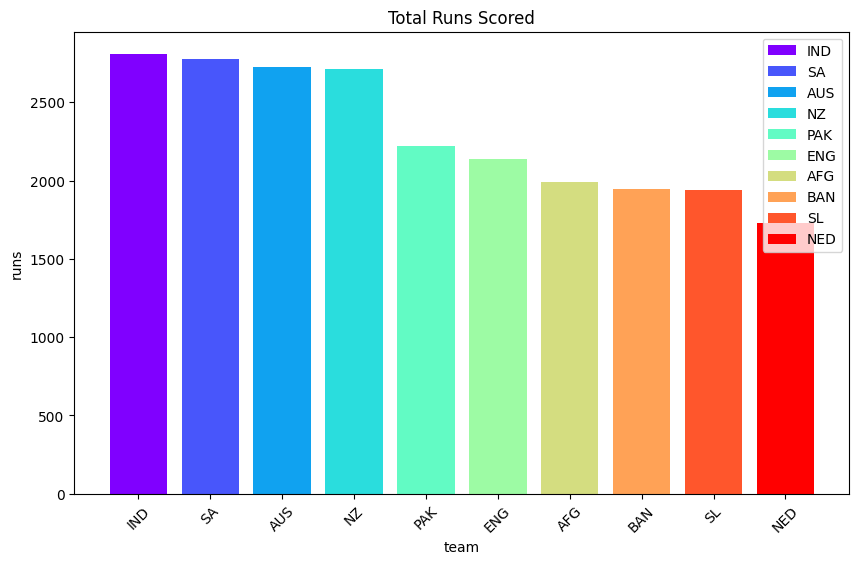

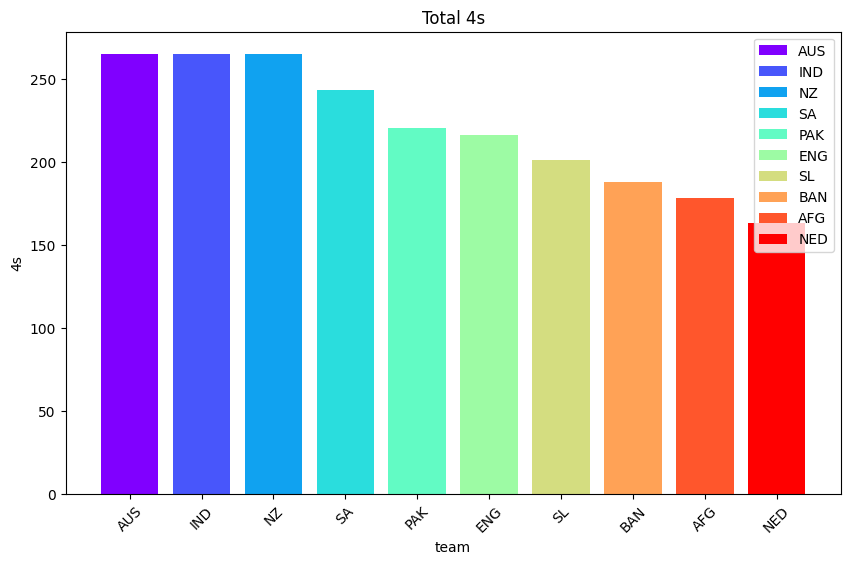

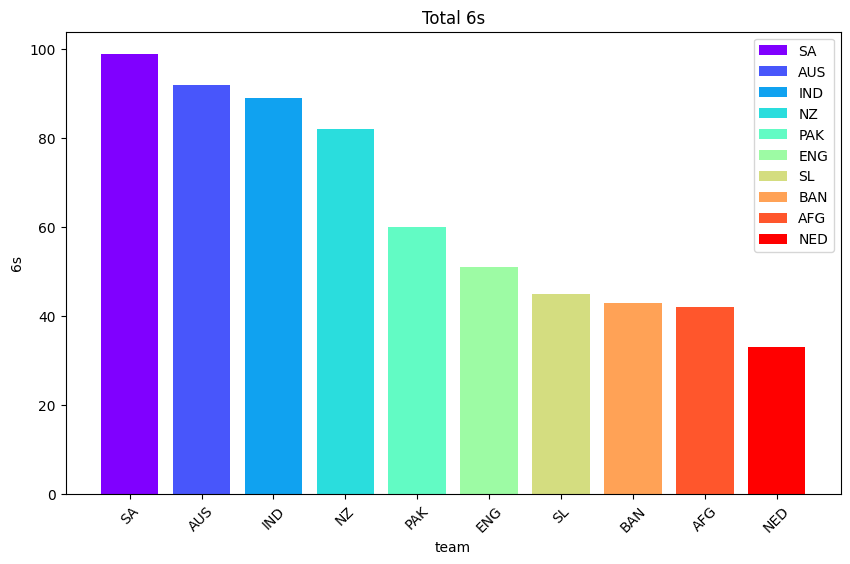

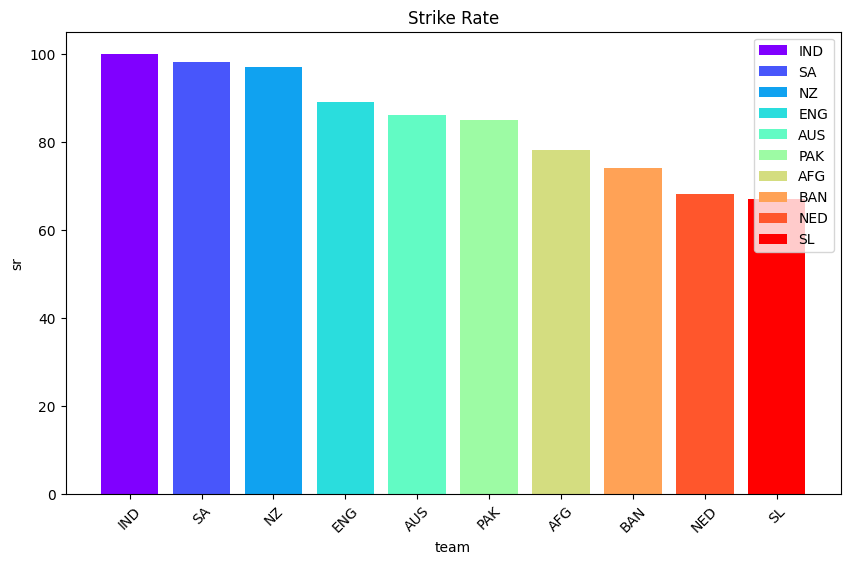

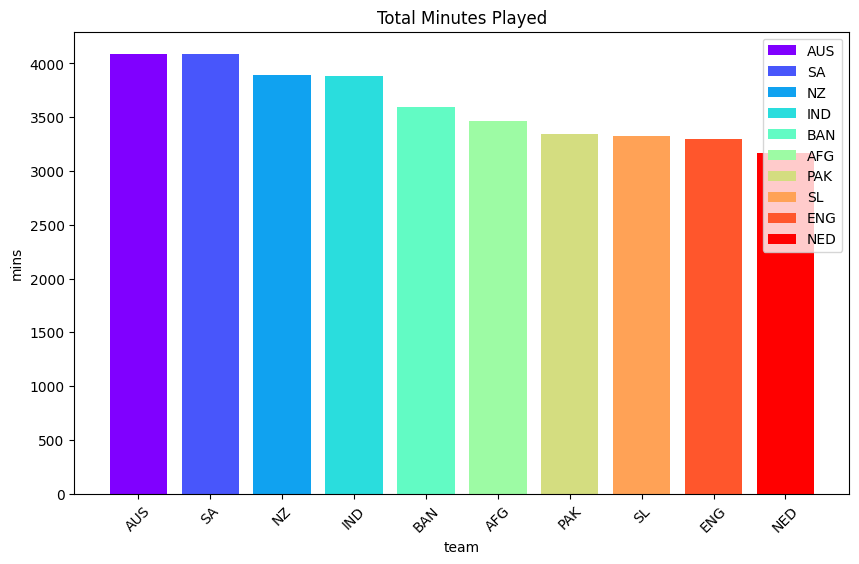

In [ ]:
# Function to plot bar graph with different colors for each team
def plot_bar_with_color(df, x_label, y_label, title):
    plt.figure(figsize=(10, 6))
    teams = df['team']
    colors = plt.cm.rainbow(np.linspace(0, 1, len(teams)))  # Creating a color scheme
    for i, team in enumerate(teams):
        plt.bar(df[df['team'] == team][x_label], df[df['team'] == team][y_label], color=colors[i], label=team)

    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(title)
    plt.legend()
    plt.xticks(rotation=45)
    plt.show()

# Plotting for each metric with different colors for each team
plot_bar_with_color(sortruns, 'team', 'runs', 'Total Runs Scored')
plot_bar_with_color(sort4s, 'team', '4s', 'Total 4s')
plot_bar_with_color(sort6s, 'team', '6s', 'Total 6s')
plot_bar_with_color(sortsr, 'team', 'sr', 'Strike Rate')
plot_bar_with_color(sortmn, 'team', 'mins', 'Total Minutes Played')


# **Batting Analysis**

### **Top Scorers**:

India, South Africa, and Australia were top three with 2810, 2773, and 2772 runs respectively. Netherlands, on the other hand, scored only a total of 1728 runs.

### **Strike Rate:**

India, South Africa, and New Zealand blazed through with strike rates of 100, 98, and 97, respectively. However, Australia's batsmen smashed the most fours and sixes. They also enjoyed the most time at the crease, followed closely by South Africa.

### **Indian and South African Brilliance:**

Both India and South Africa consistently put on batting masterclasses, solidifying their positions as the tournament's top batting orders.

#Player Performance Analysis:
Tasks to perform:
 - Evaluate individual player statistics for both batting and bowling.
 - Identify leading run-scorers and wicket-takers.
 - Assess the impact of players on their team's performance.

### Players Bowling Performance

In [ ]:
bowlingperf = df[df['bat_or_bowl']=='bowl'].groupby('player').agg({
    'bb_bf':'sum',
    'runs':'sum',
    'wkts':'sum',
    'overs':'sum',
    'mdns':'sum',
    'econ':'mean',
})
bowlingperf['econ'] = (bowlingperf['econ']).round(1)
bowlingperf.sort_values('wkts', ascending= False, inplace=True)
bowlingperf.reset_index(inplace=True)
bowlingperf.head(5)

,player,bb_bf,runs,wkts,overs,mdns,econ
0,Mohammed Shami (IND),251,210,23.0,41.5,3.0,4.9
1,A Zampa (AUS),516,471,22.0,86.0,1.0,5.4
2,D Madushanka (SL),470,525,21.0,77.8,4.0,6.8
3,G Coetzee (SA),381,396,20.0,63.3,1.0,6.4
4,JJ Bumrah (IND),497,330,18.0,82.5,7.0,3.8


In [ ]:
bowlingperfecon = bowlingperf[bowlingperf['overs']>10]
bowlingperfover = bowlingperf.sort_values('overs', ascending = False)
bowlingperfmaid = bowlingperf.sort_values('mdns', ascending = False)
bowlingperfecon[['player', 'wkts','overs', 'econ', 'mdns']].head(5)

,player,wkts,overs,econ,mdns
0,Mohammed Shami (IND),23.0,41.5,4.9,3.0
1,A Zampa (AUS),22.0,86.0,5.4,1.0
2,D Madushanka (SL),21.0,77.8,6.8,4.0
3,G Coetzee (SA),20.0,63.3,6.4,1.0
4,JJ Bumrah (IND),18.0,82.5,3.8,7.0


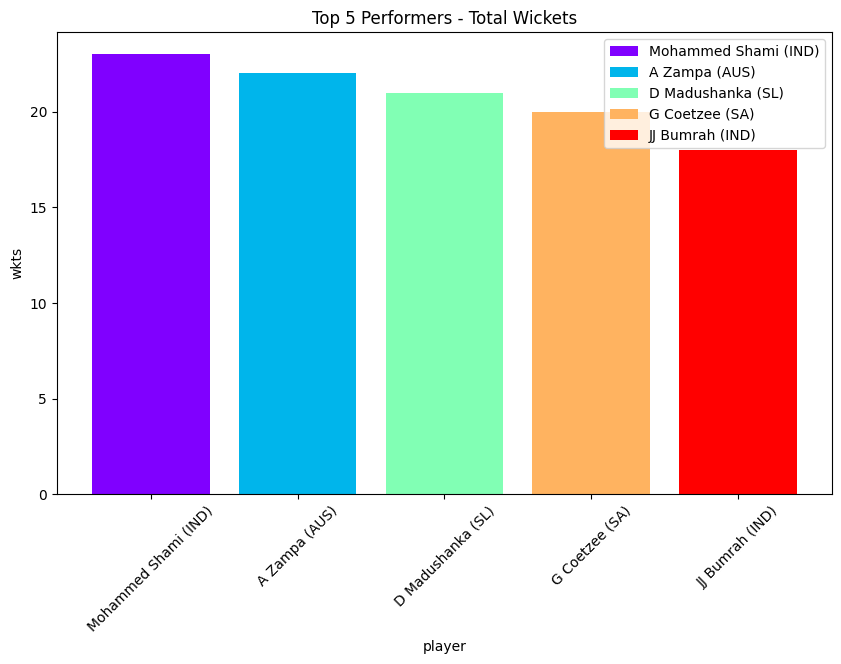

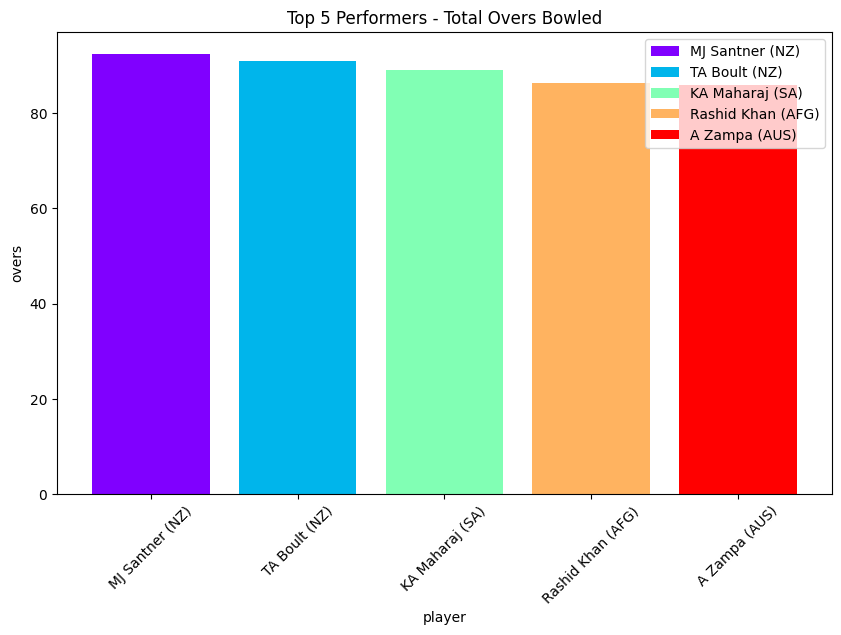

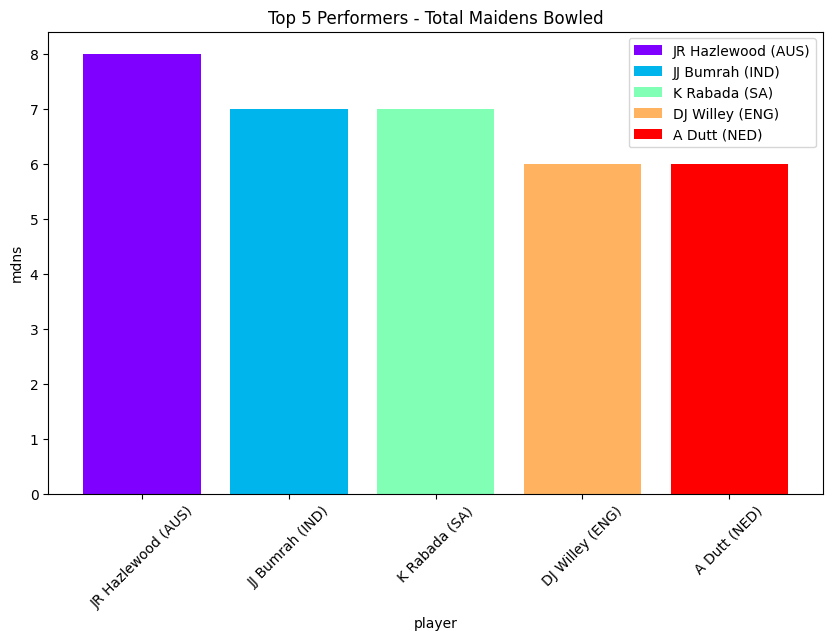

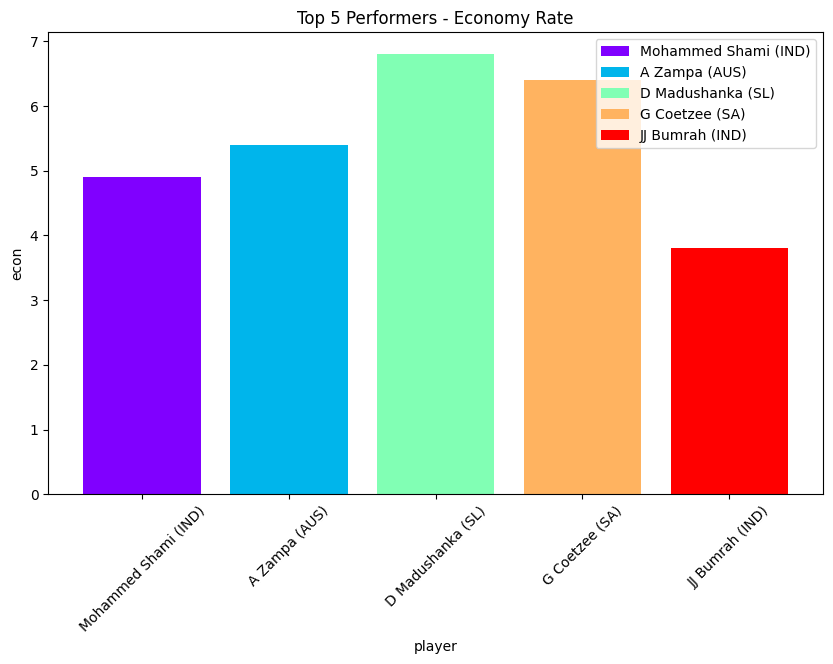

In [ ]:
# Function to plot bar graph with different colors for each player
def plot_bar_with_color(df, x_label, y_label, title, color_column):
    plt.figure(figsize=(10, 6))
    players = df['player'].head(5)  # Selecting top 5 performers
    colors = plt.cm.rainbow(np.linspace(0, 1, len(players)))  # Creating a color scheme
    for i, player in enumerate(players):
        plt.bar(df[df['player'] == player][x_label], df[df['player'] == player][y_label], color=colors[i], label=player)

    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(title)
    plt.legend()
    plt.xticks(rotation=45)
    plt.show()

# Plotting for each metric with different colors for each player (top 5 performers)
plot_bar_with_color(bowlingperfecon, 'player', 'wkts', 'Top 5 Performers - Total Wickets', 'player')
plot_bar_with_color(bowlingperfover, 'player', 'overs', 'Top 5 Performers - Total Overs Bowled', 'player')
plot_bar_with_color(bowlingperfmaid, 'player', 'mdns', 'Top 5 Performers - Total Maidens Bowled', 'player')
plot_bar_with_color(bowlingperfecon, 'player', 'econ', 'Top 5 Performers - Economy Rate', 'player')


# **Players Bowling analysis**

Mohammed Shami led the bowling attack with 23 wickets, followed closely by Adam Zampa (22) and Dilshan Madushanka (21). Mitchell Santner and Trent Boult, both from New Zealand, bowled the most, bowling 92 and 91 overs respectively. Jasprit Bumrah and Kuldeep Yadav emerged as the most economical bowlers, boasting figures of 3.7 and 3.9.

Shami's exceptional performance, with 23 wickets at an economical 4.8, cemented his position as the undisputed bowler of the tournament.

### Players Batting Performance

In [ ]:
battingperf = df[df['bat_or_bowl']=='bat'].groupby('player').agg({
    'bb_bf':'sum',
    'runs':'sum',
    'sr':'mean',
    '4s':'sum',
    '6s':'sum',
    'mins':'sum'
})
battingperf['sr'] = (battingperf['sr']).round()
battingperf.sort_values('runs',ascending=False, inplace = True)
battingperf.reset_index(inplace=True)
battingperf.head(5)


,player,bb_bf,runs,sr,4s,6s,mins
0,V Kohli (IND),784,711,83.0,64.0,9.0,1097.0
1,Q de Kock (SA),555,594,107.0,57.0,21.0,799.0
2,R Ravindra (NZ),543,578,95.0,55.0,17.0,872.0
3,DJ Mitchell (NZ),497,552,106.0,48.0,22.0,724.0
4,RG Sharma (IND),443,550,126.0,62.0,28.0,617.0


In [ ]:
# Sorting dataframes
perfsort4s = battingperf.sort_values('4s', ascending=False)
perfsort6s = battingperf.sort_values('6s', ascending=False)
perfsr = battingperf[battingperf['sr']>50]

# Print sorted dataframe
print(battingperf[['player', 'runs', 'sr', '4s', '6s']].head(5))

             player  runs     sr    4s    6s
0     V Kohli (IND)   711   83.0  64.0   9.0
1    Q de Kock (SA)   594  107.0  57.0  21.0
2   R Ravindra (NZ)   578   95.0  55.0  17.0
3  DJ Mitchell (NZ)   552  106.0  48.0  22.0
4   RG Sharma (IND)   550  126.0  62.0  28.0


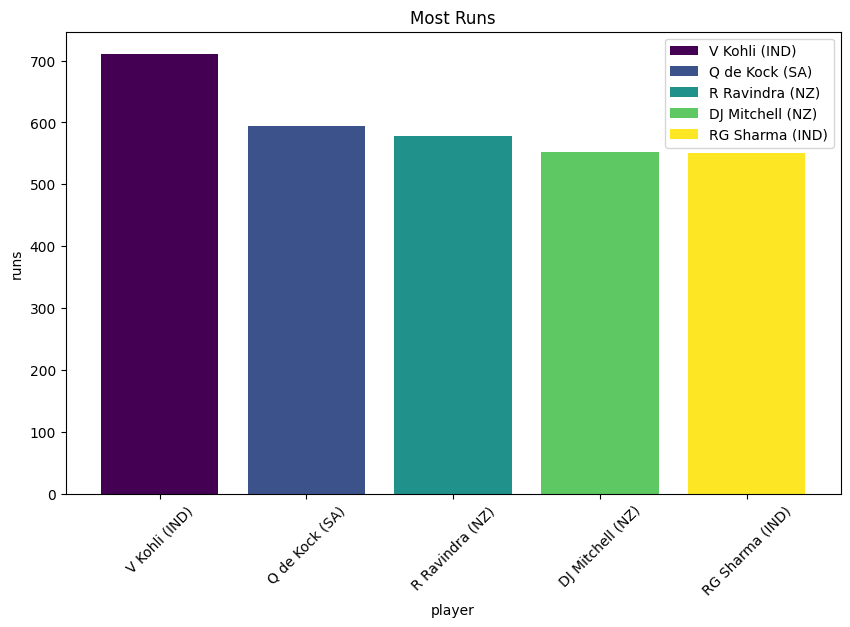

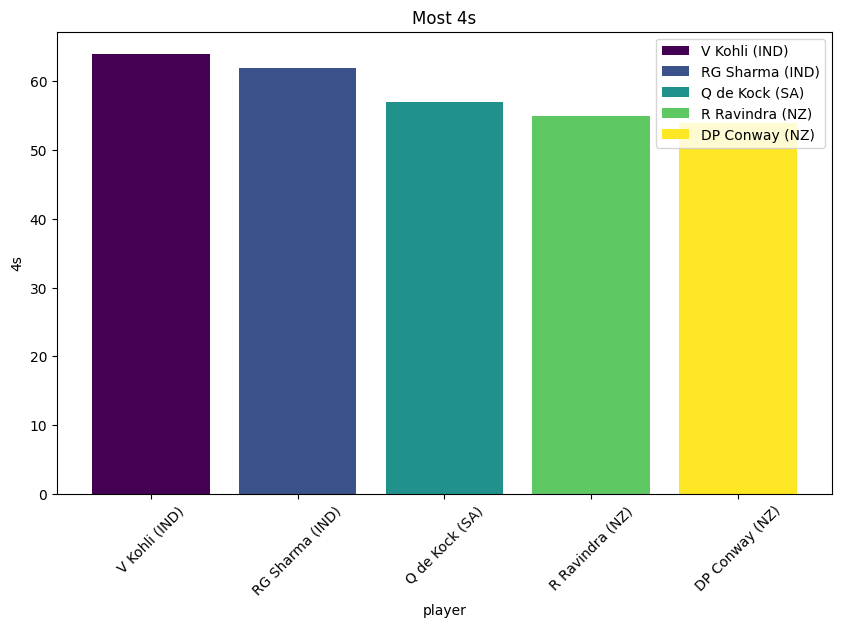

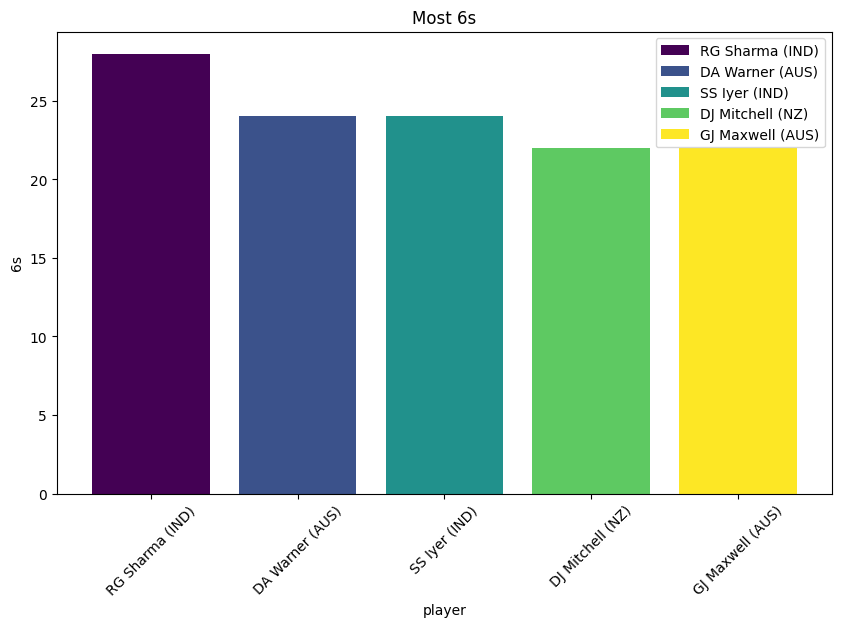

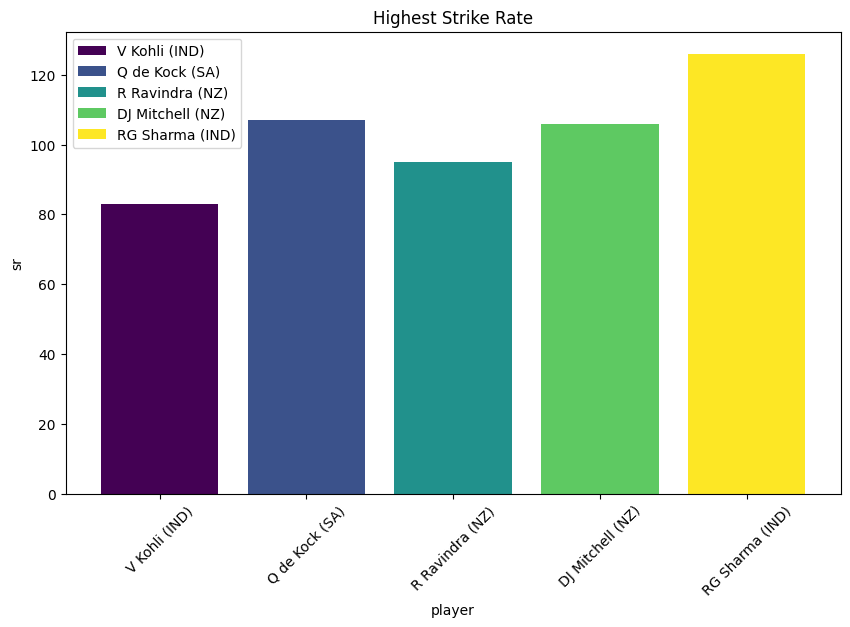

In [ ]:
# Function to plot bar graph with different colors for each player
def plot_bar_with_color(df, x_label, y_label, title):
    plt.figure(figsize=(10, 6))
    players = df['player'].head(5)
    colors = plt.cm.viridis(np.linspace(0, 1, len(players)))  # Creating a color scheme
    for i, player in enumerate(players):
        plt.bar(df[df['player'] == player][x_label], df[df['player'] == player][y_label], color=colors[i], label=player)

    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(title)
    plt.legend()
    plt.xticks(rotation=45)
    plt.show()

# Plotting for each metric with different colors for each player (top 5 performers)
most_runs = battingperf.sort_values('runs', ascending=False).head(5)
plot_bar_with_color(most_runs, 'player', 'runs', 'Most Runs')
plot_bar_with_color(perfsort4s, 'player', '4s', 'Most 4s')
plot_bar_with_color(perfsort6s, 'player', '6s', 'Most 6s')
plot_bar_with_color(perfsr, 'player', 'sr', 'Highest Strike Rate')





# **Players Batting analysis**

### **Runs Scored:**
Virat Kohli from India claimed the position of the leading run-scorer, with an impressive total of 711 runs. Following closely were Quinton de Kock with 594 runs and Rachin Ravindra with 578 runs.

### **Strike Rate and Boundaries:**
David Willey representing England secured the highest strike rate, closely trailed by Aiden Markram. In terms of boundary scoring, Virat Kohli (India) and Rohit Sharma (India) excelled by recording the maximum number of 4s and 6s, respectively.

Overall, Virat Kohli emerged as the standout player of the tournament, not only leading with a remarkable 711 runs but also securing the top position for the maximum number of 4s, earning him the title of Player of the Tournament.

#Opposition and Ground Analysis
###Team wise performance against opposition

In [ ]:
teamruns = df[df['bat_or_bowl']=='bat'].groupby(['team', 'opposition']).agg({
    'bb_bf':'sum',
    'runs':'sum',
    'sr':'mean',
    '4s':'sum',
    '6s':'sum',
    'not_out':'mean',
    'mins':'sum'
})
teamwkts = df[df['bat_or_bowl']=='bowl'].groupby(['team', 'opposition']).agg({
    'bb_bf':'sum',
    'runs':'sum',
    'wkts':'sum',
    'overs':'sum',
    'mdns':'sum',
    'econ':'mean',
})



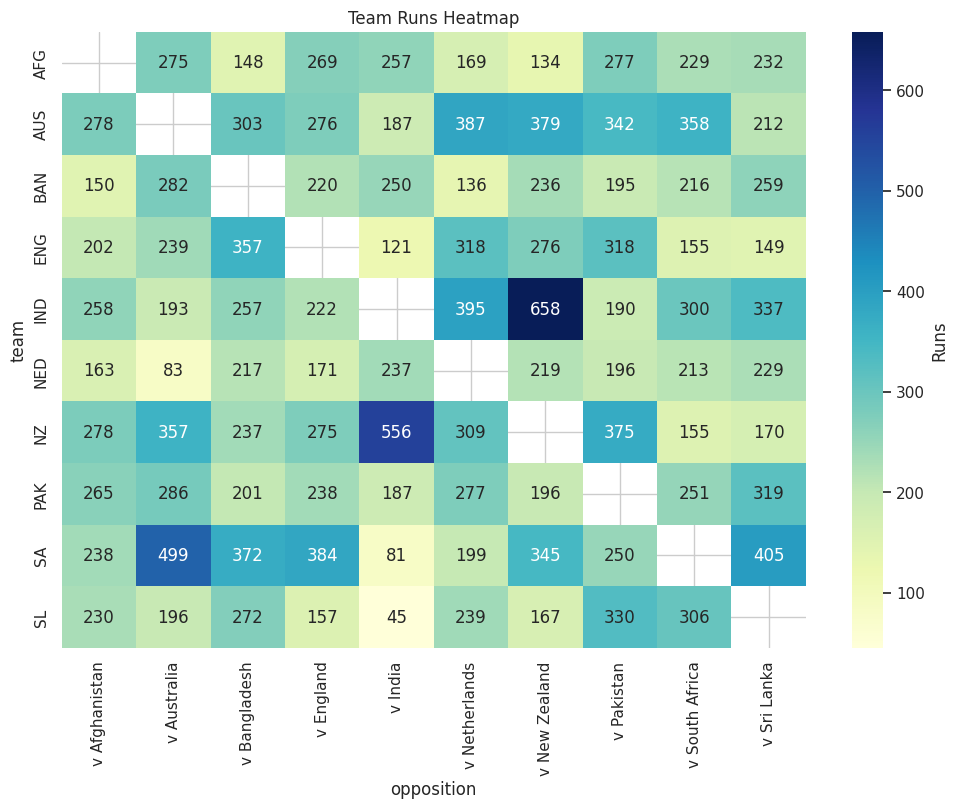

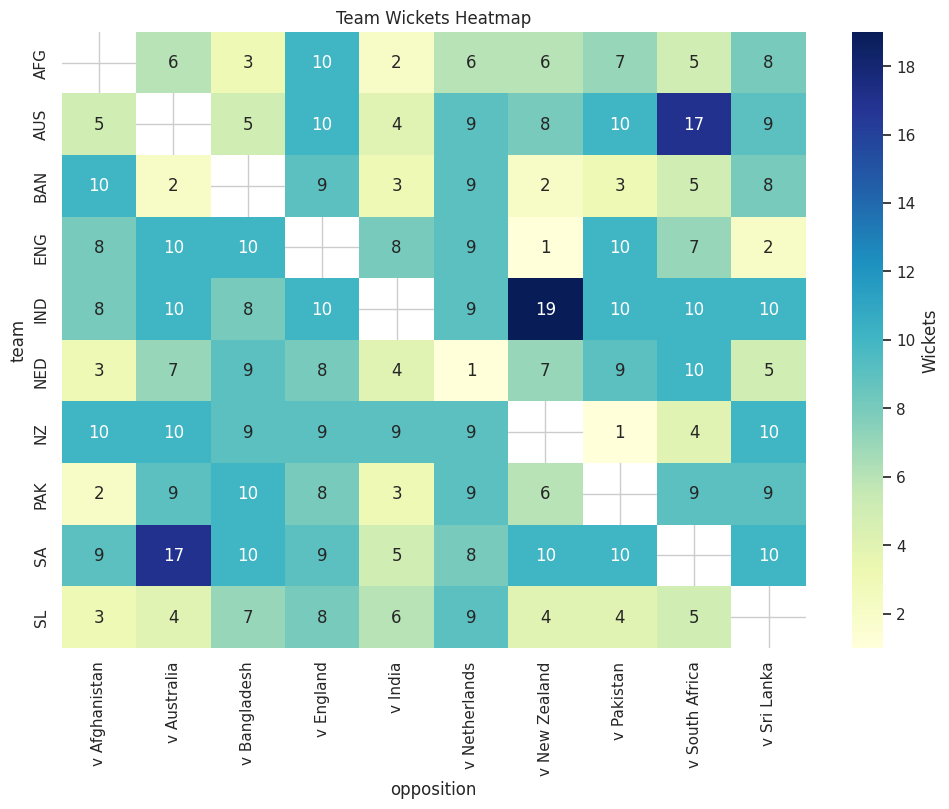

In [ ]:
# Set the style for the plots
sns.set(style="whitegrid")

# Reshape the data for heatmap
teamruns_heatmap_data = teamruns.pivot_table(index='team', columns='opposition', values='runs')
teamwkts_heatmap_data = teamwkts.pivot_table(index='team', columns='opposition', values='wkts')

# Plot heatmap for teamruns
plt.figure(figsize=(12, 8))
sns.heatmap(teamruns_heatmap_data, annot=True, cmap='YlGnBu', fmt='g', cbar_kws={'label': 'Runs'})
plt.title('Team Runs Heatmap')
plt.show()

# Plot heatmap for teamwkts
plt.figure(figsize=(12, 8))
sns.heatmap(teamwkts_heatmap_data, annot=True, cmap='YlGnBu', fmt='g', cbar_kws={'label': 'Wickets'})
plt.title('Team Wickets Heatmap')
plt.show()


###Team Performance at each Venue


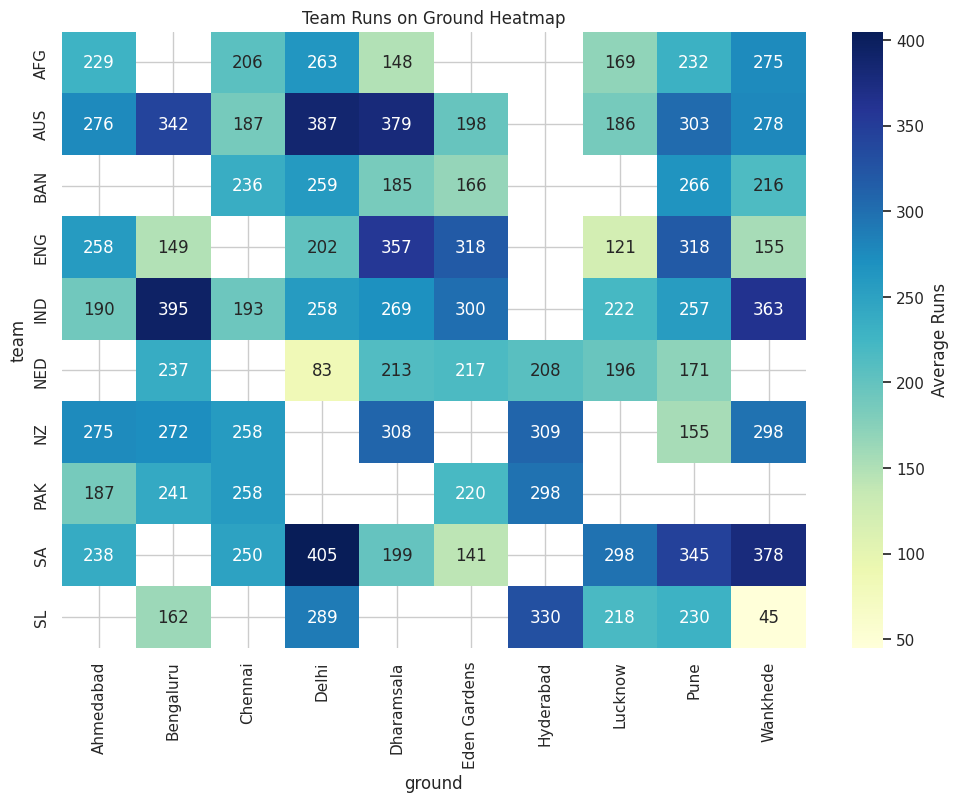

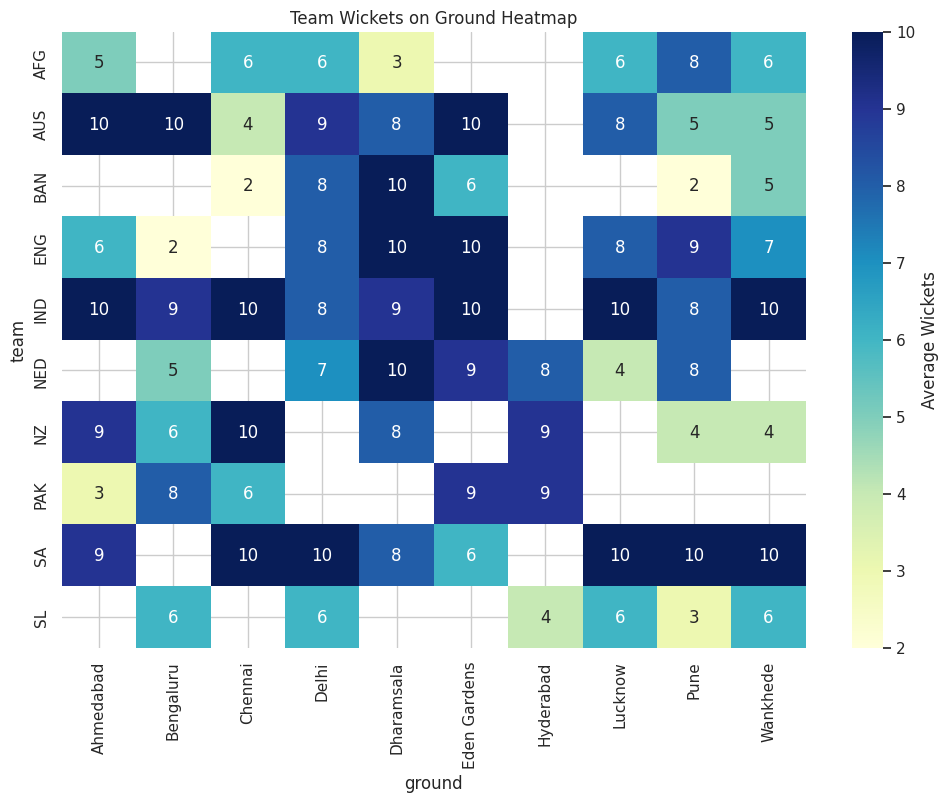

In [ ]:
teamrunsground = df[df['bat_or_bowl']=='bat'].groupby(['team', 'ground','start_date']).agg({
    'bb_bf':'sum',
    'runs':'sum',
    'sr':'mean',
    '4s':'sum',
    '6s':'sum',
    'not_out':'mean',
    'mins':'sum'
})
teamwktsground = df[df['bat_or_bowl']=='bowl'].groupby(['team', 'ground','start_date']).agg({
    'bb_bf':'sum',
    'runs':'sum',
    'wkts':'sum',
    'overs':'sum',
    'mdns':'sum',
    'econ':'mean',
})

teamrunsground = teamrunsground.groupby(['team','ground'])[['runs']].mean().reset_index()
teamrunsground['runs'] = round(teamrunsground['runs'])
teamwktsground = teamwktsground.groupby(['team','ground'])[['wkts']].mean().reset_index()
teamwktsground['wkts'] = round(teamwktsground['wkts'])

# Set the style for the plots
sns.set(style="whitegrid")

# Reshape the data for heatmap - Team Runs on Ground
teamrunsground_heatmap_data = teamrunsground.pivot_table(index='team', columns='ground', values='runs')

# Plot heatmap for teamrunsground
plt.figure(figsize=(12, 8))
sns.heatmap(teamrunsground_heatmap_data, annot=True, cmap='YlGnBu', fmt='g', cbar_kws={'label': 'Average Runs'})
plt.title('Team Runs on Ground Heatmap')
plt.show()

# Reshape the data for heatmap - Team Wickets on Ground
teamwktsground_heatmap_data = teamwktsground.pivot_table(index='team', columns='ground', values='wkts')

# Plot heatmap for teamwktsground
plt.figure(figsize=(12, 8))
sns.heatmap(teamwktsground_heatmap_data, annot=True, cmap='YlGnBu', fmt='g', cbar_kws={'label': 'Average Wickets'})
plt.title('Team Wickets on Ground Heatmap')
plt.show()


# Temporal Analysis
Tasks to perform:
 - Study performance trends over time, considering start dates and overs played.
 - Identify any temporal patterns or changes in team and player performance.

In [ ]:
import plotly.graph_objects as go

def plotPerformance(teams, batting, bowling):
   # Create separate figures for Runs and Wickets
   fig_runs = go.Figure(data=[go.Scatter(x=batting['start_date'], y=batting['runs'], mode='lines', name='Runs')])
   fig_runs.update_layout(title=f'{teams} Runs Over Time', xaxis_title='Date', yaxis_title='Runs')

   fig_wickets = go.Figure(data=[go.Scatter(x=bowling['start_date'], y=bowling['wkts'], mode='lines', name='Wickets')])
   fig_wickets.update_layout(title=f'{teams} Wickets Over Time', xaxis_title='Date', yaxis_title='Wickets')

   # Display both figures
   fig_runs.show()
   fig_wickets.show()

def teamPerformance(df):
   batting = df[df['bat_or_bowl'] == 'bat'].groupby(['start_date'])[['runs']].sum().reset_index()
   bowling = df[df['bat_or_bowl'] == 'bowl'].groupby(['start_date'])[['wkts']].sum().reset_index()

   return batting, bowling

# ... rest of your code remains the same ...


uniqueTeams = df['team'].unique()

for teams in uniqueTeams:
    teamData = df[df['team'] == teams]
    batting, bowling = teamPerformance(teamData)
    plotPerformance(teams, batting, bowling)



In summary, it can be inferred that the most consistently performing teams throughout the tournament were India, Australia, South Africa, and New Zealand. These teams demonstrated commendable performances in both batting and bowling. The 2023 Cricket World Cup was ultimately won by Australia, while India secured the runner-up position.